In [1]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
import pandas as pd
from scipy import stats
import seaborn as sns
import statsmodels.formula.api as smf

import warnings 
warnings.filterwarnings('ignore')
%matplotlib inline
sns.set(style='white', context='talk', palette='deep') 
import matplotlib.style as style
style.use('fivethirtyeight')

#Plotly
import chart_studio.plotly as py
import plotly.graph_objs as go
from plotly.offline import init_notebook_mode,iplot
init_notebook_mode(connected=True)

from wordcloud import WordCloud

pd.options.display.float_format = '{:,.2f}'.format

%matplotlib inline  

In [2]:
#Reading in the dataset
df_kc = pd.read_csv("kingcounty.csv")

In [3]:
pd.set_option('display.max_columns', 999)
df_kc.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,"221,900.00",3,1.00,1180,5650,1.00,nan,0.00,3,7,1180,0.0,1955,0.00,98178,47.51,-122.26,1340,5650
1,6414100192,12/9/2014,"538,000.00",3,2.25,2570,7242,2.00,0.00,0.00,3,7,2170,400.0,1951,"1,991.00",98125,47.72,-122.32,1690,7639
2,5631500400,2/25/2015,"180,000.00",2,1.00,770,10000,1.00,0.00,0.00,3,6,770,0.0,1933,nan,98028,47.74,-122.23,2720,8062
3,2487200875,12/9/2014,"604,000.00",4,3.00,1960,5000,1.00,0.00,0.00,5,7,1050,910.0,1965,0.00,98136,47.52,-122.39,1360,5000
4,1954400510,2/18/2015,"510,000.00",3,2.00,1680,8080,1.00,0.00,0.00,3,8,1680,0.0,1987,0.00,98074,47.62,-122.05,1800,7503


In [4]:
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [5]:
df_kc['sqft_basement'] = pd.to_numeric(df_kc['sqft_basement'], errors='coerce')
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21143 non-null  float64
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

In [6]:
#Conversion of sales dates to month and years
df_kc["year"] = pd.DatetimeIndex(df_kc["date"]).year
df_kc["month"] = pd.DatetimeIndex(df_kc["date"]).month
df_kc['date'] = pd.to_datetime(df_kc["date"])

print(df_kc.head())
print(df_kc.info())

           id       date      price  bedrooms  bathrooms  sqft_living  \
0  7129300520 2014-10-13 221,900.00         3       1.00         1180   
1  6414100192 2014-12-09 538,000.00         3       2.25         2570   
2  5631500400 2015-02-25 180,000.00         2       1.00          770   
3  2487200875 2014-12-09 604,000.00         4       3.00         1960   
4  1954400510 2015-02-18 510,000.00         3       2.00         1680   

   sqft_lot  floors  waterfront  view  condition  grade  sqft_above  \
0      5650    1.00         nan  0.00          3      7        1180   
1      7242    2.00        0.00  0.00          3      7        2170   
2     10000    1.00        0.00  0.00          3      6         770   
3      5000    1.00        0.00  0.00          5      7        1050   
4      8080    1.00        0.00  0.00          3      8        1680   

   sqft_basement  yr_built  yr_renovated  zipcode   lat    long  \
0           0.00      1955          0.00    98178 47.51 -122.26   


In [7]:
df_kc.describe([0.05, 0.25, 0.5, 0.75, 0.95, 0.99])

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
count,"21,597.00","21,597.00","21,597.00","21,597.00","21,597.00","21,597.00","21,597.00","19,221.00","21,534.00","21,597.00","21,597.00","21,597.00","21,143.00","21,597.00","17,755.00","21,597.00","21,597.00","21,597.00","21,597.00","21,597.00","21,597.00","21,597.00"
mean,"4,580,474,287.77","540,296.57",3.37,2.12,"2,080.32","15,099.41",1.49,0.01,0.23,3.41,7.66,"1,788.60",291.85,"1,971.00",83.64,"98,077.95",47.56,-122.21,"1,986.62","12,758.28","2,014.32",6.57
std,"2,876,735,715.75","367,368.14",0.93,0.77,918.11,"41,412.64",0.54,0.09,0.77,0.65,1.17,827.76,442.50,29.38,399.95,53.51,0.14,0.14,685.23,"27,274.44",0.47,3.12
min,"1,000,102.00","78,000.00",1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,3.00,370.00,0.00,"1,900.00",0.00,"98,001.00",47.16,-122.52,399.00,651.00,"2,014.00",1.00
5%,"512,740,390.00","210,000.00",2.00,1.00,940.00,"1,800.80",1.00,0.00,0.00,3.00,6.00,850.00,0.00,"1,915.00",0.00,"98,004.00",47.31,-122.39,"1,140.00","2,002.40","2,014.00",2.00
25%,"2,123,049,175.00","322,000.00",3.00,1.75,"1,430.00","5,040.00",1.00,0.00,0.00,3.00,7.00,"1,190.00",0.00,"1,951.00",0.00,"98,033.00",47.47,-122.33,"1,490.00","5,100.00","2,014.00",4.00
50%,"3,904,930,410.00","450,000.00",3.00,2.25,"1,910.00","7,618.00",1.50,0.00,0.00,3.00,7.00,"1,560.00",0.00,"1,975.00",0.00,"98,065.00",47.57,-122.23,"1,840.00","7,620.00","2,014.00",6.00
75%,"7,308,900,490.00","645,000.00",4.00,2.50,"2,550.00","10,685.00",2.00,0.00,0.00,4.00,8.00,"2,210.00",560.00,"1,997.00",0.00,"98,118.00",47.68,-122.12,"2,360.00","10,083.00","2,015.00",9.00
95%,"9,297,300,412.00","1,160,000.00",5.00,3.50,"3,760.00","43,307.20",2.00,0.00,2.00,5.00,10.00,"3,400.00","1,190.00","2,011.00",0.00,"98,177.00",47.75,-121.98,"3,300.00","37,045.20","2,015.00",12.00
99%,"9,558,800,025.20","1,970,000.00",6.00,4.25,"4,980.00","213,008.00",3.00,0.00,4.00,5.00,11.00,"4,370.00","1,660.00","2,014.00","2,008.00","98,199.00",47.77,-121.78,"4,080.00","157,687.00","2,015.00",12.00


In [8]:
sum(df_kc.duplicated(['id']))

177

In [9]:
#Delete douplicates
#Check which one of the dublicates is a typo
df_kc = df_kc.drop_duplicates(['id'], keep='first')
sum(df_kc.duplicated(['id']))

0

In [10]:
df_kc.shape

(21420, 23)

In [11]:
df_kc.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 21420 entries, 0 to 21596
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21420 non-null  int64         
 1   date           21420 non-null  datetime64[ns]
 2   price          21420 non-null  float64       
 3   bedrooms       21420 non-null  int64         
 4   bathrooms      21420 non-null  float64       
 5   sqft_living    21420 non-null  int64         
 6   sqft_lot       21420 non-null  int64         
 7   floors         21420 non-null  float64       
 8   waterfront     19067 non-null  float64       
 9   view           21357 non-null  float64       
 10  condition      21420 non-null  int64         
 11  grade          21420 non-null  int64         
 12  sqft_above     21420 non-null  int64         
 13  sqft_basement  20968 non-null  float64       
 14  yr_built       21420 non-null  int64         
 15  yr_renovated   1761

In [12]:
variables = df_kc.columns
variables

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year', 'month'],
      dtype='object')

In [13]:
count = []
for variable in variables:
    length = df_kc[variable].count()
    count.append(length)
    
count_pct = np.round(100 * pd.Series(count) / len(df_kc), 2)

In [14]:
len(df_kc)

21420

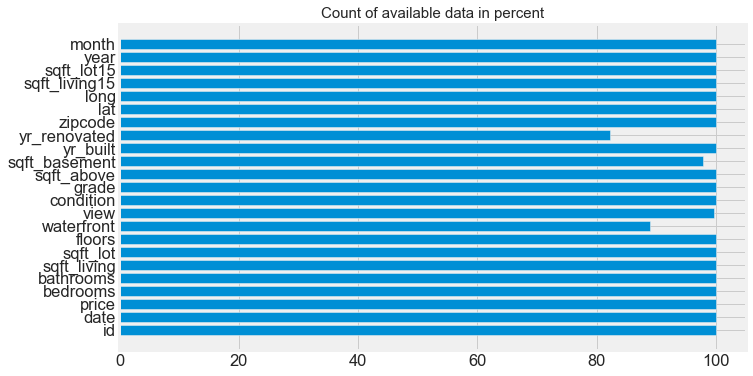

In [15]:
#Plot number of available data per variable
plt.figure(figsize=(10,6))
plt.barh(variables, count_pct)
plt.title('Count of available data in percent', fontsize=15)
plt.show()

In [16]:
df_kc['waterfront'].fillna(0, inplace=True)

In [17]:
df_kc['yr_renovated'].fillna(df_kc['yr_built'], inplace=True)

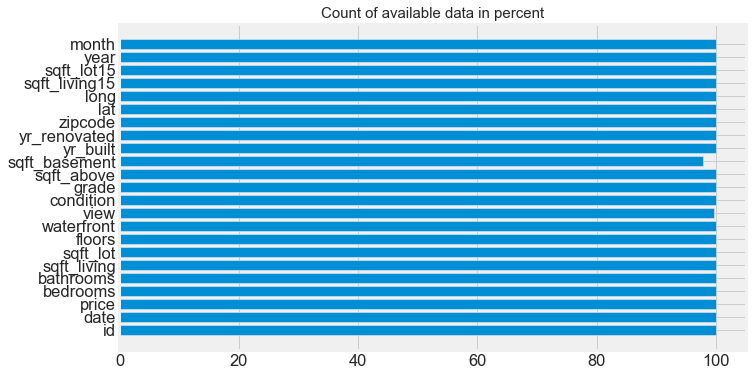

In [18]:
#Check for further missings
count = []
for variable in variables:
    length = df_kc[variable].count()
    count.append(length)
    
count_pct = np.round(100 * pd.Series(count) / len(df_kc), 2)

#Plot number of available data per variable
plt.figure(figsize=(10,6))
plt.barh(variables, count_pct)
plt.title('Count of available data in percent', fontsize=15)
plt.show()


In [19]:
df_kc.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month
count,"21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,357.00","21,420.00","21,420.00","21,420.00","20,968.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00","21,420.00"
mean,"4,580,939,869.16","540,739.30",3.37,2.12,"2,083.13","15,128.04",1.50,0.01,0.23,3.41,7.66,"1,791.17",292.07,"1,971.09",418.92,"98,077.87",47.56,-122.21,"1,988.38","12,775.72","2,014.32",6.59
std,"2,876,761,172.45","367,931.11",0.93,0.77,918.81,"41,530.80",0.54,0.08,0.77,0.65,1.17,828.69,442.70,29.39,807.45,53.48,0.14,0.14,685.54,"27,345.62",0.47,3.11
min,"1,000,102.00","78,000.00",1.00,0.50,370.00,520.00,1.00,0.00,0.00,1.00,3.00,370.00,0.00,"1,900.00",0.00,"98,001.00",47.16,-122.52,399.00,651.00,"2,014.00",1.00
25%,"2,123,537,386.75","322,500.00",3.00,1.75,"1,430.00","5,040.00",1.00,0.00,0.00,3.00,7.00,"1,200.00",0.00,"1,952.00",0.00,"98,033.00",47.47,-122.33,"1,490.00","5,100.00","2,014.00",4.00
50%,"3,904,921,185.00","450,000.00",3.00,2.25,"1,920.00","7,614.00",1.50,0.00,0.00,3.00,7.00,"1,560.00",0.00,"1,975.00",0.00,"98,065.00",47.57,-122.23,"1,840.00","7,620.00","2,014.00",6.00
75%,"7,308,900,186.25","645,000.00",4.00,2.50,"2,550.00","10,690.50",2.00,0.00,0.00,4.00,8.00,"2,220.00",560.00,"1,997.00",0.00,"98,117.00",47.68,-122.12,"2,370.00","10,086.25","2,015.00",9.00
max,"9,900,000,190.00","7,700,000.00",33.00,8.00,"13,540.00","1,651,359.00",3.50,1.00,4.00,5.00,13.00,"9,410.00","4,820.00","2,015.00","2,015.00","98,199.00",47.78,-121.31,"6,210.00","871,200.00","2,015.00",12.00


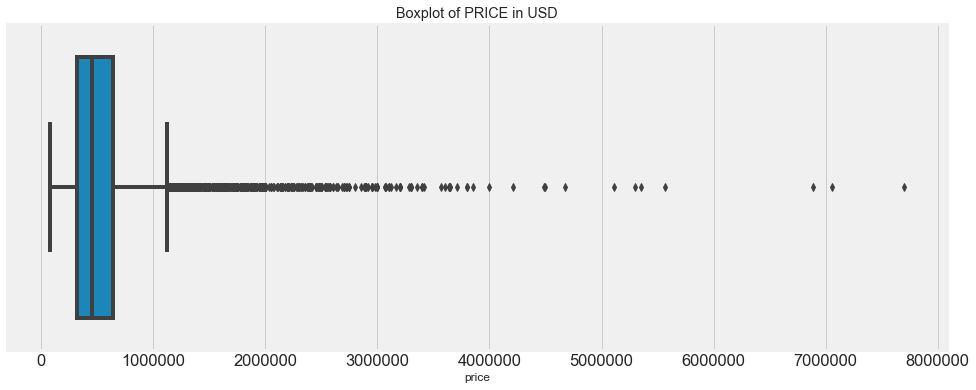

In [20]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.boxplot(x='price', data=df_kc)
plt.ticklabel_format(style='plain', axis='x')
plt.title('Boxplot of PRICE in USD')
plt.show()

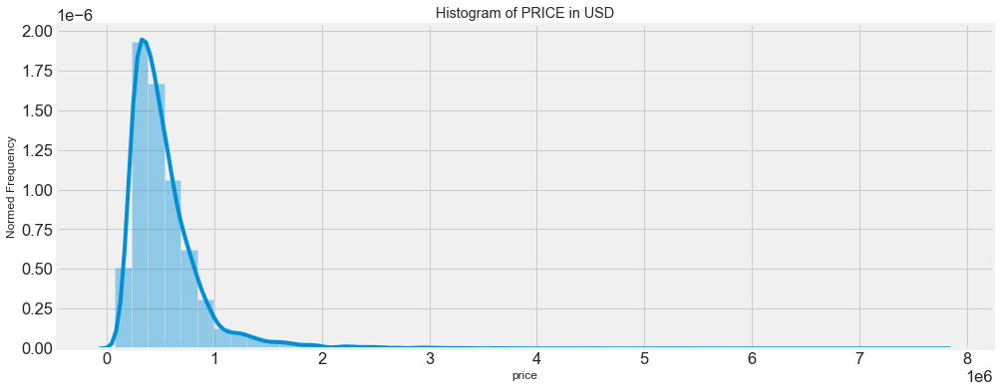

In [21]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.distplot(df_kc['price'])
plt.title('Histogram of PRICE in USD')
plt.ylabel('Normed Frequency')
plt.show()

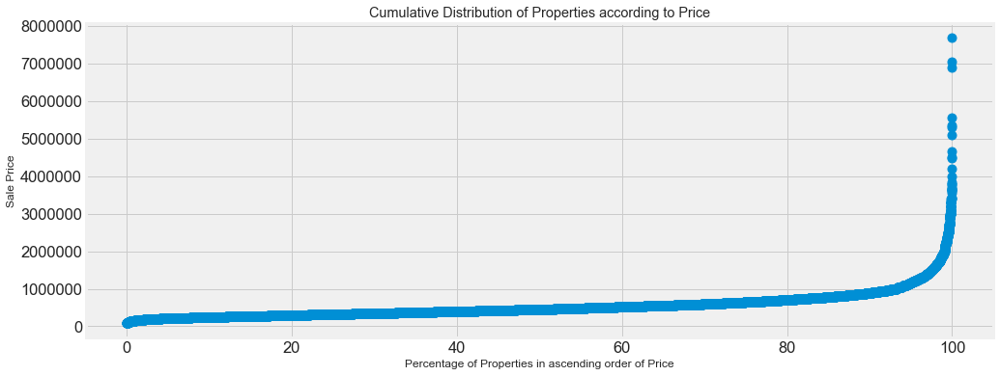

In [22]:
#Set the size of the plot
plt.figure(figsize=(15,6))

#Get the data and format it
x = df_kc[['price']].sort_values(by='price').reset_index()
x['PROPERTY PROPORTION'] = 1
x['PROPERTY PROPORTION'] = x['PROPERTY PROPORTION'].cumsum()
x['PROPERTY PROPORTION'] = 100* x['PROPERTY PROPORTION'] / len(x['PROPERTY PROPORTION'])

# Plot the data and configure the settings
plt.plot(x['PROPERTY PROPORTION'],x['price'], linestyle='None', marker='o')
plt.title('Cumulative Distribution of Properties according to Price')
plt.xlabel('Percentage of Properties in ascending order of Price')
plt.ylabel('Sale Price')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

In [23]:
# Remove observations that fall outside those caps
df_kc_cleaned = df_kc[(df_kc['price'] > 100000) & (df_kc['price'] < 2000000) & (df_kc['bedrooms'] < 33)]
len(df_kc_cleaned)

21181

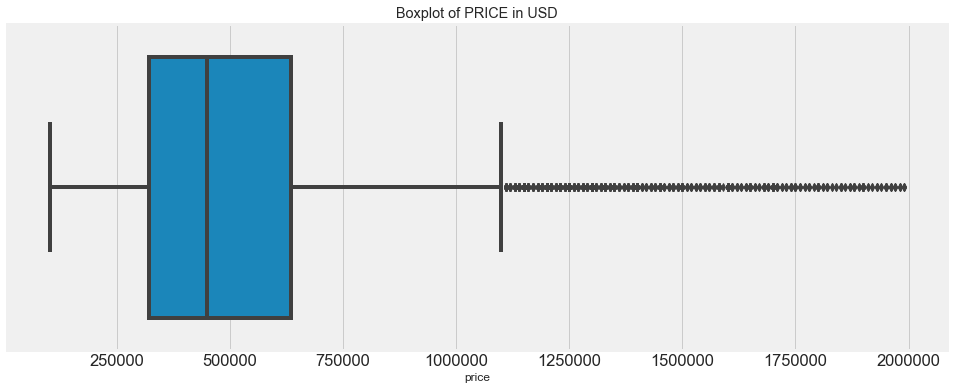

In [24]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.boxplot(x='price', data=df_kc_cleaned)
plt.ticklabel_format(style='plain', axis='x')
plt.title('Boxplot of PRICE in USD')
plt.show()

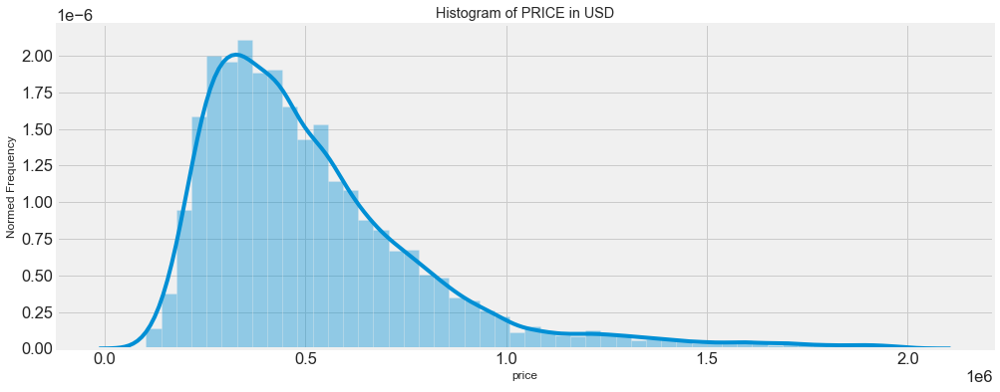

In [25]:
#Set the size of the plot
plt.figure(figsize=(15,6))

# Plot the data and configure the settings
sns.distplot(df_kc_cleaned['price'])
plt.title('Histogram of PRICE in USD')
plt.ylabel('Normed Frequency')
plt.show()

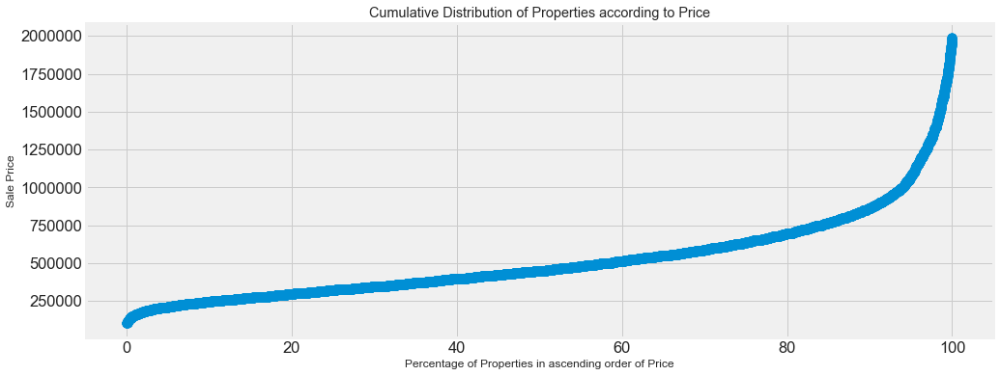

In [26]:
#Set the size of the plot
plt.figure(figsize=(15,6))

#Get the data and format it
x = df_kc_cleaned[['price']].sort_values(by='price').reset_index()
x['PROPERTY PROPORTION'] = 1
x['PROPERTY PROPORTION'] = x['PROPERTY PROPORTION'].cumsum()
x['PROPERTY PROPORTION'] = 100* x['PROPERTY PROPORTION'] / len(x['PROPERTY PROPORTION'])

# Plot the data and configure the settings
plt.plot(x['PROPERTY PROPORTION'],x['price'], linestyle='None', marker='o')
plt.title('Cumulative Distribution of Properties according to Price')
plt.xlabel('Percentage of Properties in ascending order of Price')
plt.ylabel('Sale Price')
plt.ticklabel_format(style='plain', axis='y')
plt.show()

In [27]:
# Keeps properties with fewer than 20,000 Square Feet, which is about 2,000 Square Metres
df_kc_cleaned = df_kc_cleaned[df_kc_cleaned['sqft_living'] < 5000]
df_kc_cleaned = df_kc_cleaned[df_kc_cleaned['sqft_lot'] < 215000]

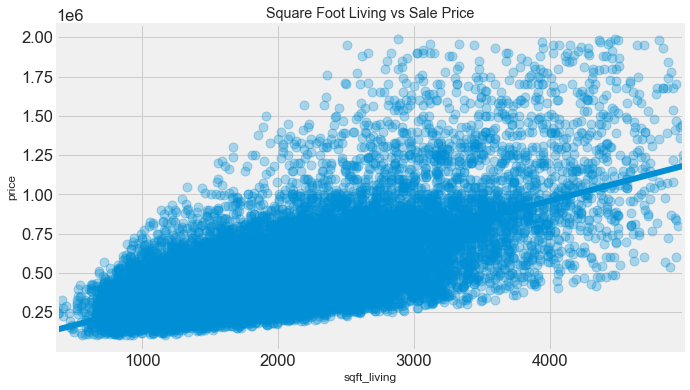

In [28]:
plt.figure(figsize=(10,6))
sns.regplot(x='sqft_living', y='price', data=df_kc_cleaned, fit_reg=True, scatter_kws={'alpha':0.3})
plt.title('Square Foot Living vs Sale Price')
plt.show()

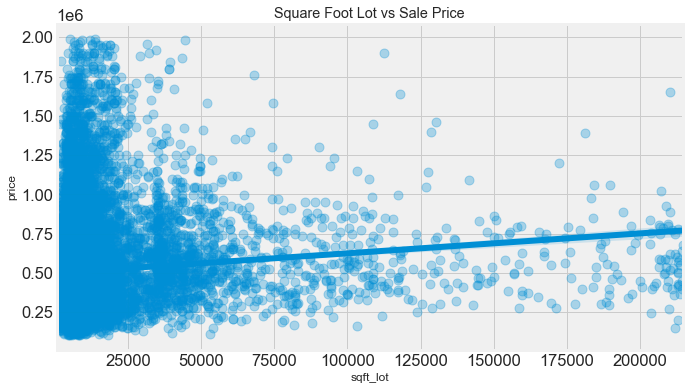

In [29]:
plt.figure(figsize=(10,6))
sns.regplot(x='sqft_lot', y='price', data=df_kc_cleaned, fit_reg=True, scatter_kws={'alpha':0.3})
plt.title('Square Foot Lot vs Sale Price')
plt.show()

In [30]:
df_kc_cleaned.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year', 'month'],
      dtype='object')

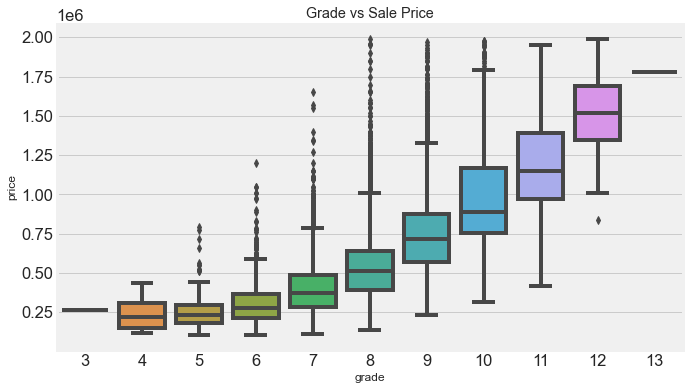

In [31]:
plt.figure(figsize=(10,6))
sns.boxplot(x='grade', y='price', data=df_kc_cleaned)
plt.title('Grade vs Sale Price')
plt.show()

In [32]:
df_kc_cleaned['lnprice'] = np.log(df_kc_cleaned['price'])

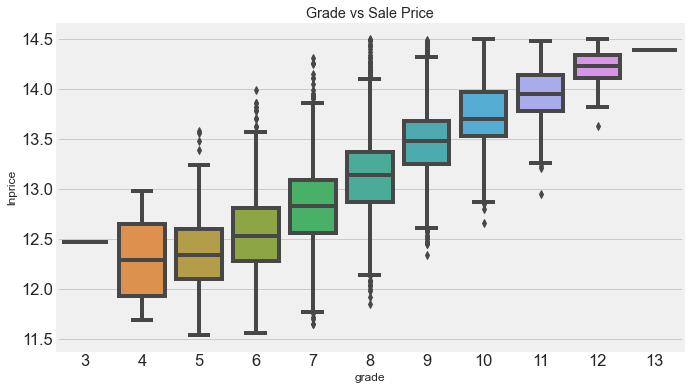

In [33]:
plt.figure(figsize=(10,6))
sns.boxplot(x='grade', y='lnprice', data=df_kc_cleaned)
plt.title('Grade vs Sale Price')
plt.show()

In [34]:
bin_labels_5 = ['ancient', 'old', 'oldish', 'recent', 'new']
df_kc_cleaned['built_bracket'] = pd.qcut(df_kc_cleaned['yr_built'],
                              q=[0, .2, .4, .6, .8, 1],
                              labels=bin_labels_5)
df_kc_cleaned.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,year,month,lnprice,built_bracket
0,7129300520,2014-10-13,"221,900.00",3,1.00,1180,5650,1.00,0.00,0.00,3,7,1180,0.00,1955,0.00,98178,47.51,-122.26,1340,5650,2014,10,12.31,old
1,6414100192,2014-12-09,"538,000.00",3,2.25,2570,7242,2.00,0.00,0.00,3,7,2170,400.00,1951,"1,991.00",98125,47.72,-122.32,1690,7639,2014,12,13.20,old
2,5631500400,2015-02-25,"180,000.00",2,1.00,770,10000,1.00,0.00,0.00,3,6,770,0.00,1933,"1,933.00",98028,47.74,-122.23,2720,8062,2015,2,12.10,ancient
3,2487200875,2014-12-09,"604,000.00",4,3.00,1960,5000,1.00,0.00,0.00,5,7,1050,910.00,1965,0.00,98136,47.52,-122.39,1360,5000,2014,12,13.31,oldish
4,1954400510,2015-02-18,"510,000.00",3,2.00,1680,8080,1.00,0.00,0.00,3,8,1680,0.00,1987,0.00,98074,47.62,-122.05,1800,7503,2015,2,13.14,recent


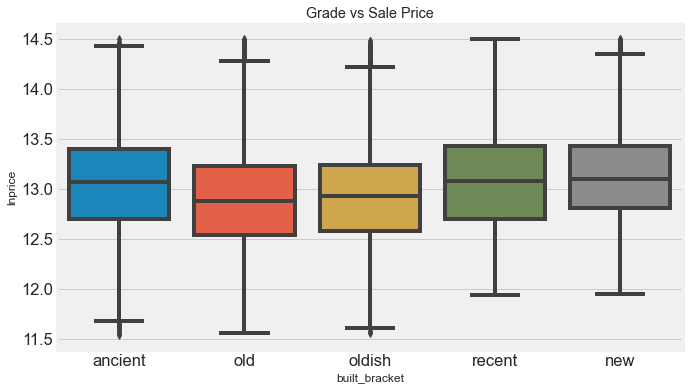

In [35]:
plt.figure(figsize=(10,6))
sns.boxplot(x='built_bracket', y='lnprice', data=df_kc_cleaned)
plt.title('Grade vs Sale Price')
plt.show()

In [36]:
df_kc_cleaned['yr_built'].describe([0, .2, .4, .6, .8, 1])

count   20,869.00
mean     1,970.87
std         29.36
min      1,900.00
0%       1,900.00
20%      1,947.00
40%      1,964.00
50%      1,974.00
60%      1,983.00
80%      2,001.00
100%     2,015.00
max      2,015.00
Name: yr_built, dtype: float64

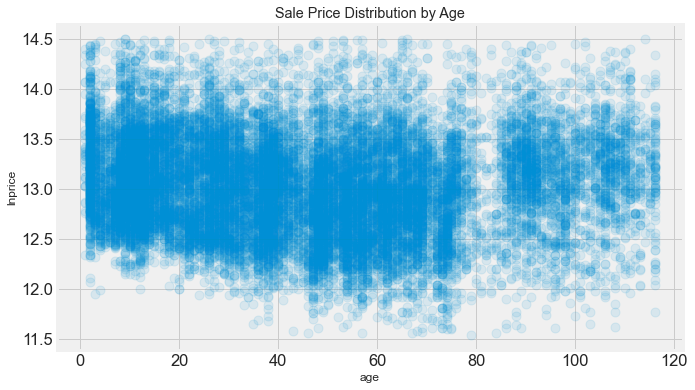

In [37]:
df_kc_cleaned['age'] = 2016 - df_kc_cleaned['yr_built']
plt.figure(figsize=(10,6))
sns.regplot(x='age', y='lnprice', data=df_kc_cleaned, fit_reg=False, scatter_kws={'alpha':0.1})
plt.title('Sale Price Distribution by Age')
plt.show();

In [38]:
df_kc_cleaned.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'sqft_basement', 'yr_built', 'yr_renovated', 'zipcode',
       'lat', 'long', 'sqft_living15', 'sqft_lot15', 'year', 'month',
       'lnprice', 'built_bracket', 'age'],
      dtype='object')

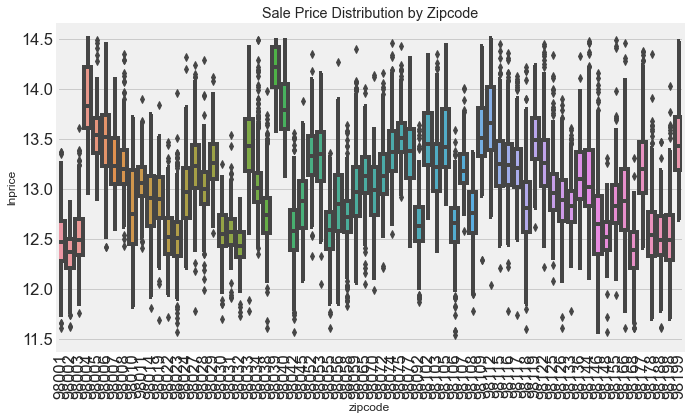

In [39]:
plt.figure(figsize=(10,6))
order = sorted(df_kc_cleaned['zipcode'].unique())
sns.boxplot(x='zipcode', y='lnprice', data=df_kc_cleaned, order=order)
plt.xticks(rotation=90)
plt.title('Sale Price Distribution by Zipcode')
plt.show()


In [40]:
df_kc_cleaned.drop(['sqft_basement'], axis=1, inplace=True)

In [41]:
df_kc_cleaned.columns

Index(['id', 'date', 'price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'view', 'condition', 'grade',
       'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month', 'lnprice',
       'built_bracket', 'age'],
      dtype='object')

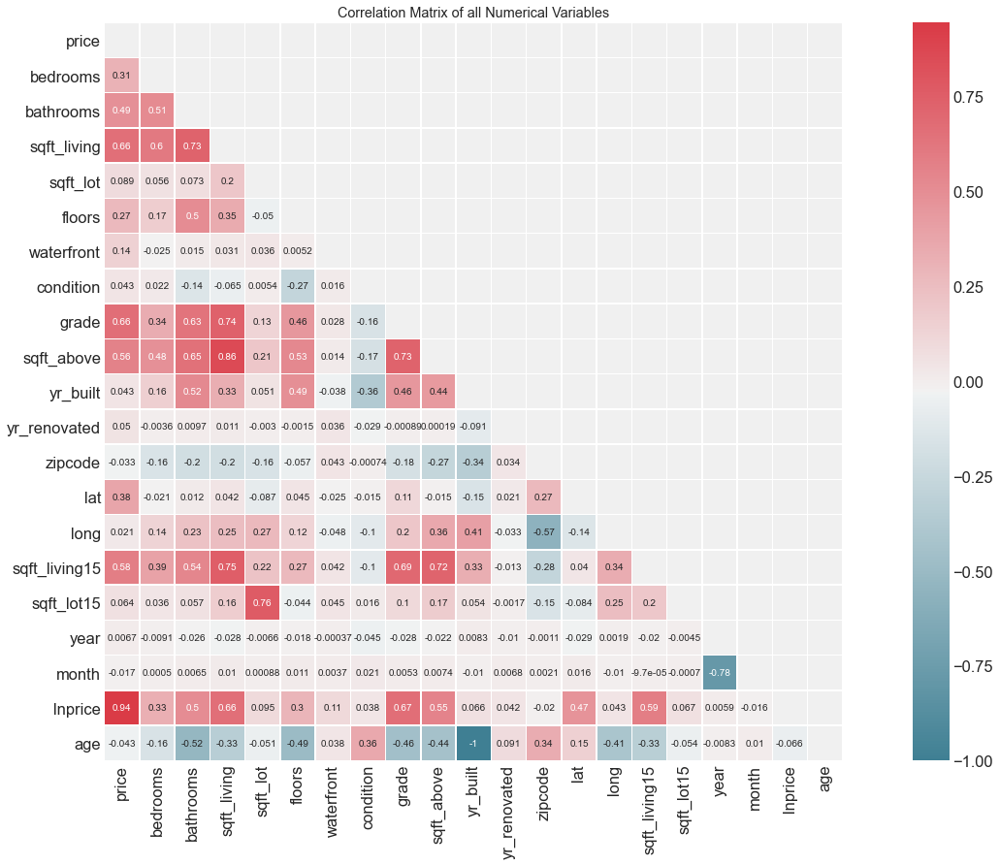

In [42]:
# Correlation Matrix

# Compute the correlation matrix
d= df_kc_cleaned[['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'condition', 'grade',
       'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month', 'lnprice', 'age']]
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(23, 14))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.show()



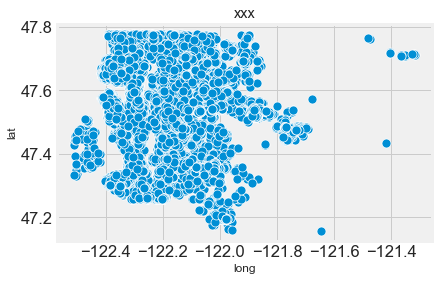

In [43]:
sns.scatterplot(data=df_kc_cleaned, x="long", y="lat")
plt.title('xxx')
plt.show()

In [44]:

bubble1 = go.Scatter(x=df_kc_cleaned.built_bracket,y=df_kc_cleaned.bedrooms,name="Bedroom",mode="markers",marker=dict(size=df_kc_cleaned.floors*5,color="rgba(0,0,0,1)"))
bubble2 = go.Scatter(x=df_kc_cleaned.built_bracket,y=df_kc_cleaned.bathrooms,name="Bathroom",mode="markers",marker=dict(size=df_kc_cleaned.floors*5,color="rgba(255,0,255,1)"))

bubbledata = [bubble1,bubble2]

layoutbubble = go.Layout(title="Bedroom vs Bathroom with Floors(Size)",xaxis=dict(title="House Age"),yaxis=dict(title="Bedrooms & Bathrooms"))

bubblefig = go.Figure(data=bubbledata,layout=layoutbubble)

iplot(bubblefig)


In [45]:
#set colors
df_kc_cleaned["color"] = ""
df_kc_cleaned.color[df_kc_cleaned.built_bracket == 'ancient'] = "rgb(0,0,0)"
df_kc_cleaned.color[df_kc_cleaned.built_bracket == 'old'] = "rgb(220,220,220)"
df_kc_cleaned.color[df_kc_cleaned.built_bracket == 'oldish'] = "rgb(242, 177, 172)"
df_kc_cleaned.color[df_kc_cleaned.built_bracket == 'recent'] = "rgb(255,133,27)"
df_kc_cleaned.color[df_kc_cleaned.built_bracket == 'new'] = "rgb(255,255,204)"

In [46]:
#list lat and long
lats = list(df_kc_cleaned.lat.values)
longs = list(df_kc_cleaned.long.values)

In [47]:
mapbox_access_token = 'pk.eyJ1IjoiZGFya2NvcmUiLCJhIjoiY2pscGFheHA1MXdqdjNwbmR3c290MTZ6dCJ9.K1FMv_q3ZVlKP13RrjFkjg'

mapp = [go.Scattermapbox(lat=lats,lon=longs,mode="markers",marker=dict(size=4.5,color=df_kc_cleaned["color"]) ,hoverinfo="text",text=" Built Year:"+df_kc_cleaned.yr_built.apply(str)+" Price:"+df_kc_cleaned.price.apply(str))]

layout5 = dict(title="built_bracket - Built Year(+2000) Map",width=800,height=750,hovermode="closest",mapbox=dict(bearing=0,pitch=0,zoom=9,center=dict(lat=47.5,lon=-122.161),accesstoken=mapbox_access_token))

fig5 = go.Figure(data=mapp,layout=layout5)

iplot(fig5)


In [48]:
hist1 = [go.Histogram(x=df_kc_cleaned.color,marker=dict(color='rgb(102, 0, 102)'))]

histlayout1 = go.Layout(title="Colurs by age bucket",xaxis=dict(title="color"),yaxis=dict(title="counts"))

histfig1 = go.Figure(data=hist1,layout=histlayout1)

iplot(histfig1)


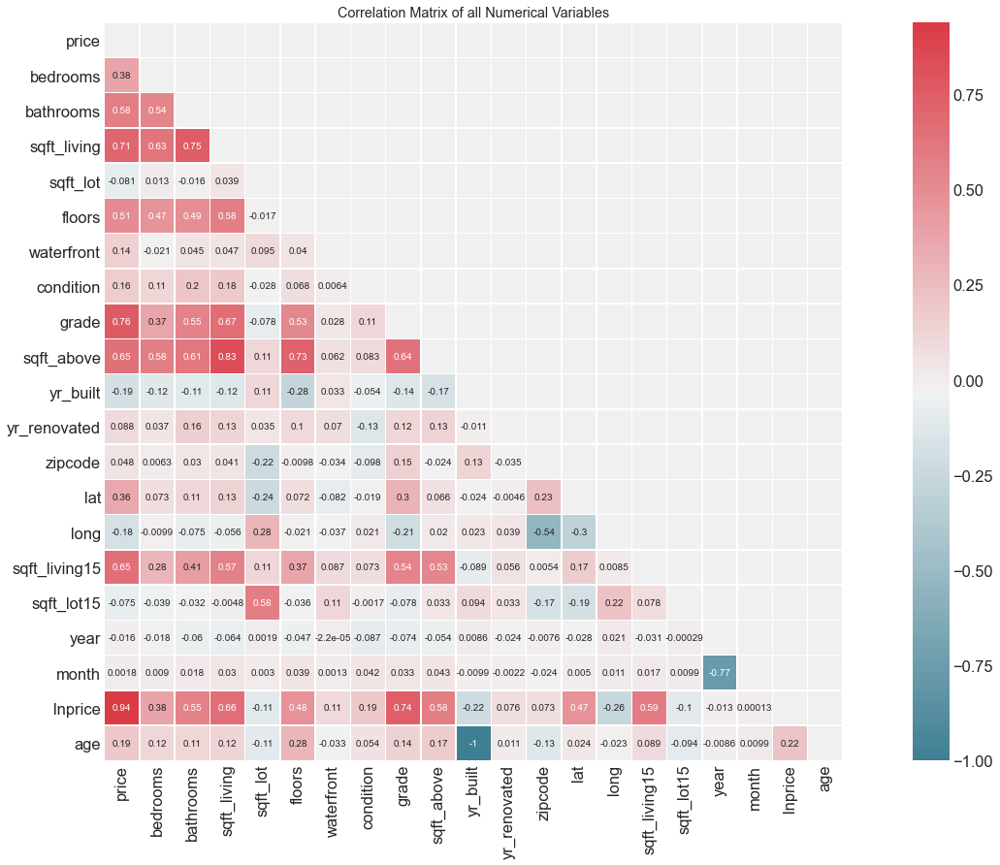

In [49]:
# Correlation Matrix - only for ANCIENT houses
df_ancient =df_kc_cleaned[df_kc_cleaned.built_bracket =='ancient']

# Compute the correlation matrix
d= df_ancient[['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'condition', 'grade',
       'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month', 'lnprice', 'age']]
corr_ancient = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(23, 14))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_ancient, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.show()

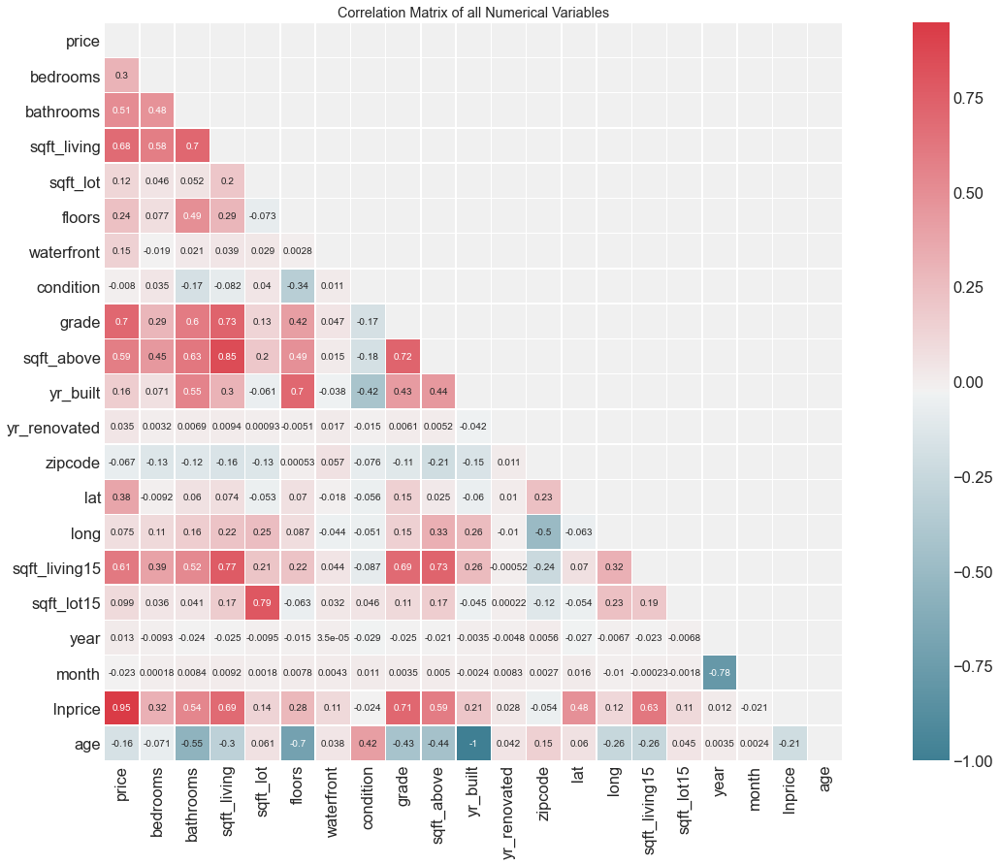

In [50]:
# Correlation Matrix - EXCEPT for ANCIENT houses
df_not_ancient =df_kc_cleaned[df_kc_cleaned.built_bracket != 'ancient']

# Compute the correlation matrix
d= df_not_ancient[['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'condition', 'grade',
       'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month', 'lnprice', 'age']]
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(23, 14))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.show()

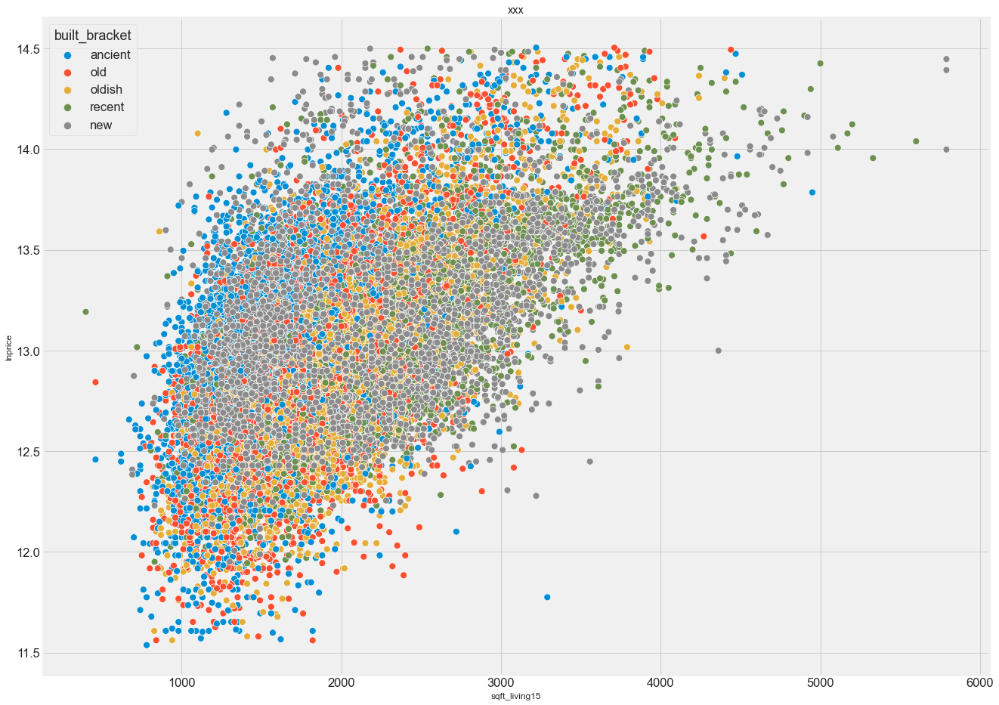

In [51]:
plt.figure(figsize=(20,16))
sns.scatterplot(data=df_kc_cleaned, x="sqft_living15", y="lnprice", hue='built_bracket')
plt.title('xxx')
plt.show()

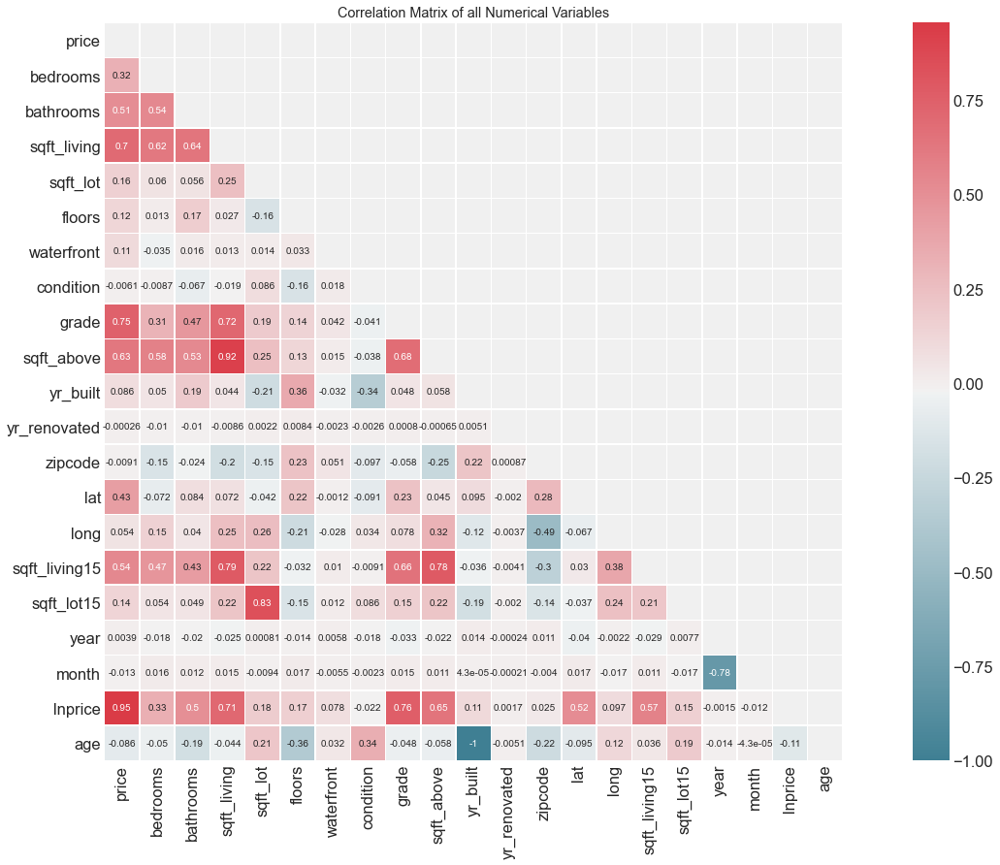

In [52]:
# Correlation Matrix - EXCEPT for OLD and OLDISH houses
df_newer =df_kc_cleaned[(df_kc_cleaned.built_bracket == 'new') | (df_kc_cleaned.built_bracket == 'recent')]


# Compute the correlation matrix
d= df_newer[['price', 'bedrooms', 'bathrooms', 'sqft_living',
       'sqft_lot', 'floors', 'waterfront', 'condition', 'grade',
       'sqft_above', 'yr_built', 'yr_renovated', 'zipcode', 'lat', 'long',
       'sqft_living15', 'sqft_lot15', 'year', 'month', 'lnprice', 'age']]
corr = d.corr()

# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(23, 14))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(220, 10, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, 
            square=True, linewidths=.5, annot=True, cmap=cmap)
plt.yticks(rotation=0)
plt.title('Correlation Matrix of all Numerical Variables')
plt.show()

In [53]:
corr['lnprice']

price            0.95
bedrooms         0.33
bathrooms        0.50
sqft_living      0.71
sqft_lot         0.18
floors           0.17
waterfront       0.08
condition       -0.02
grade            0.76
sqft_above       0.65
yr_built         0.11
yr_renovated     0.00
zipcode          0.02
lat              0.52
long             0.10
sqft_living15    0.57
sqft_lot15       0.15
year            -0.00
month           -0.01
lnprice          1.00
age             -0.11
Name: lnprice, dtype: float64

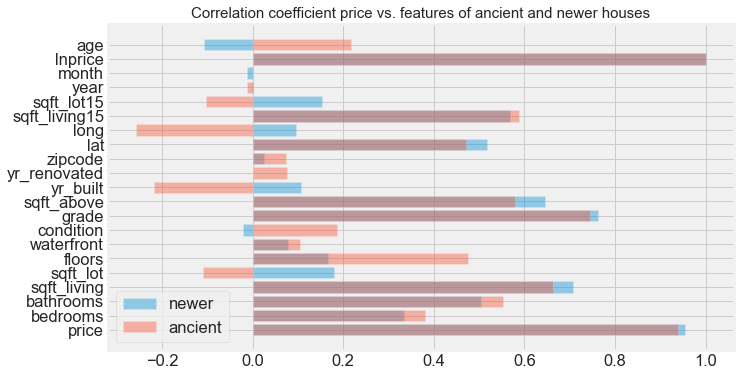

In [54]:
#Plot number of available data per variable
plt.figure(figsize=(10,6))
h1= plt.barh(corr.index, corr['lnprice'], alpha=0.4, label='newer')
h2= plt.barh(corr_ancient.index, corr_ancient['lnprice'], alpha=0.4, label='ancient')
#plt.legend(h1,'newer')
#plt.legend(h2,'ancient')
plt.legend()
plt.title('Correlation coefficient price vs. features of ancient and newer houses', fontsize=15)
plt.show()

* Train one OLS for the anciencient and one for the nwer
* RSME score for newer and ancient houses (cant be predicted so well) 
* Oldish not cool enocght, unreneovated, year reneovated, 

In [55]:
import plotly.graph_objects as go
fig = go.Figure(data=go.Bar(y=[2, 3, 1]))
fig.show()

In [56]:
#Import graphic jpg
from IPython.display import Image
from IPython.core.display import HTML 

Image(filename = Kingcounty_EDA + "historical_house_scary.jpg", width=100, height=100)


#from IPython.display import Image
#from IPython.core.display import HTML
#Image("Seattle_skyline.jpg")

![title](link to file)

NameError: name 'Kingcounty_EDA' is not defined

In [ ]:
#Scaling the data to make houses comparable, assuming that larger houses are more expensive
#Calculate price per sqft_living 
#hdata['pricesq'] = hdata['price'] / hdata['sqft_living']



#hdata.hist(['price'], bins = 50, figsize = (20, 15))
#plt.title('Number of houses by price')
#plt.xlabel('Price')
#plt.ylabel('Count');